<a href="https://colab.research.google.com/github/lmorato/time-series-project/blob/main/time_series_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PROJECT: time series prediction model
- DATASET: energy consumption over time
- SOURCE: https://archive.ics.uci.edu/ml/datasets/ElectricityLoadDiagrams20112014#
- LANGUAGE: Python
- ENVIRONMENT: Google Colab

- define if code is running on Colab.

In [ ]:
import sys

def system_environment():
  return 'google.colab' in sys.modules

if system_environment:
  print("running on Google's Colab?: {}".format(system_environment()))

running on Google's Colab?: True


- update colab's package manager for linux distribution.

In [ ]:
!apt-get update

Get:1 http://security.ubuntu.com/ubuntu focal-security InRelease [114 kB]
Get:2 https://cloud.r-project.org/bin/linux/ubuntu focal-cran40/ InRelease [3,622 B]
Ign:3 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu2004/x86_64  InRelease
Hit:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  InRelease
Hit:5 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu2004/x86_64  Release
Hit:6 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu focal InRelease
Hit:7 http://archive.ubuntu.com/ubuntu focal InRelease
Get:8 http://archive.ubuntu.com/ubuntu focal-updates InRelease [114 kB]
Hit:9 http://ppa.launchpad.net/cran/libgit2/ubuntu focal InRelease
Get:11 http://security.ubuntu.com/ubuntu focal-security/main amd64 Packages [2,496 kB]
Hit:12 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu focal InRelease
Get:13 http://archive.ubuntu.com/ubuntu focal-backports InRelease [108 kB]
Get:14 http://security.ubuntu.com/ubuntu f

- For project version control, install git;
- Because while running 1st time's installation got message about deprecated library ('libnvidia...'), remove it;
- Also because of message while 1st time installation (run update again);
- Get git version after processes.

In [ ]:
!apt-get install git
!apt-get remove --purge libnvidia-common-510
!apt-get update
!git --version

Reading package lists... Done
Building dependency tree       
Reading state information... Done
git is already the newest version (1:2.25.1-1ubuntu3.10).
0 upgraded, 0 newly installed, 0 to remove and 19 not upgraded.
Reading package lists... Done
Building dependency tree       
Reading state information... Done
Package 'libnvidia-common-510' is not installed, so not removed
0 upgraded, 0 newly installed, 0 to remove and 19 not upgraded.
Hit:1 https://cloud.r-project.org/bin/linux/ubuntu focal-cran40/ InRelease
Hit:2 http://security.ubuntu.com/ubuntu focal-security InRelease
Ign:3 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu2004/x86_64  InRelease
Hit:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  InRelease
Hit:5 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu2004/x86_64  Release
Hit:6 http://archive.ubuntu.com/ubuntu focal InRelease
Hit:7 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu focal 

- Import python libraries.

In [ ]:
import pandas as pd
import numpy as np
import datetime
import matplotlib.pyplot as plt
!pip install plotly

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


- Mount google drive's instance on colab environment.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# data cleaning code

- Goal: be able to transform strings containing info about date/time into datetime dtype;
- step_01: copy an entry containing string with date/time info and paste it in code storing in variable 'test_str';
- step_02: after having read documentation, attempt to concatenate datetime elements in 'format' variable;
- step_03: to check if attemptive 'format' is compatible with datetime elements contained in string 'test_str', test hypothesis using a try/except based on boolean variable 'res';
- step_04: if bool(datetime.strptime()) is kept 'True', then datetime implicit in 'test_str' is compatible with that of 'format', and analysis can proceed.

In [ ]:
# VALIDATING DATETIME FORMAT:
# Python3 code to demonstrate working of
# Validate String date format
# Using strptime()
from datetime import datetime 
# initializing string
test_str = '2011-01-01 00:15:00'
 
# initializing format
format = '%Y-%m-%d %H:%M:%S'
 
# checking if format matches the date
res = True
 
# using try-except to check for truth value
try:
    res = bool(datetime.strptime(test_str, format))
except ValueError:
    res = False
 
# printing result
print("Does date match format? : " + str(res))

Does date match format? : True


- since datetime 'format' has been stablished, it is possible to start working with date/time info column;
- first, unnamed header containing said info ('Unnamed: 0') is renamed 'datetime';
- after renaming column, proper datetime format is applied to it's row entries.
- most 

In [ ]:
open('/content/drive/MyDrive/Colab Notebooks/datasets/time_series_original_data.txt') as raw_file:  raw_data = pd.read_csv(raw_file, delimiter=';', header=0)
data_timecol = raw_data.rename(columns={'Unnamed: 0':'datetime'})
data_timecol['datetime'] = pd.to_datetime(data_timecol['datetime'], format='%Y-%m-%d %H:%M:%S')
 

/usr/local/lib/python3.8/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,125,126,127,128,129,130,131,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,157,160,164,165,167,170,173,177,178,179,181,184,185,186,223,224,255,280,289,305,308,322,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,363,364,365,366,367,368,369,370) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


- after adjusting datetime column, it is possible to pay attention to remaining 'data' columns, each entry of which denotes energy consumption values;
- energy consumption values are given as object dtypes. It is necessary to convert them into float type.
- Initially though, this is not entirelly possible because not all number objects have the same structure:
- while most data entries are written as float numbers with decimal values separated by '.', some of them are separated by ','.
- to correct this, it is possible to run a loop trhoughout the dataframe substituting comma separated values by '.' an then converting then to float values instead of objects;
- after this processs, it is possible to check if all values have been converted, or if there is some other problem locking the convertion;
- the resultant file is saved as a different version;


In [ ]:
for col in data_timecol.columns:
  if data_timecol[col].dtype == 'object':
    try:
    data_timecol[col] = data_timecol[col].astype(float)
    except ValueError:
    data_timecol[col] = data_timecol[col].str.replace(',', '.')
      try:
      data_timecol[col] = data_timecol[col].astype(float)
      except ValueError as e:
          print(f"column {col} could not be converted to float: {e}")

print(data_timecol.dtypes)
data_timecol.to_csv('/content/drive/MyDrive/Colab Notebooks/datasets/data_datetime-index_float-cols.csv', index=False)

- After converting object data to floats, it is possible to start checking for empty rows;

In [ ]:
open(r'/content/drive/MyDrive/Colab Notebooks/datasets/data_datetime-index_float-cols.csv') as new_file:
data = pd.read_csv(new_file, delimiter=',', header=0)
data['datetime'] = pd.to_datetime(data['datetime'], format='%Y-%m-%d %H:%M:%S')
print(data.dtypes)
print(data.isna)


- before cleaning empty rows, it is necessary to aggregate data. If cleaning is done before aggregation, it is likely we would get truncated results, resulting in datetimes expressed both in terms of minutes but also days;
- resampling is also important both because of the efficiency yielded by compression, and also to get more maneageble dataset for future prediction model;
- the result is saved as a different file for version control purposes;

In [ ]:
data_resamp = data.resample('D', on='datetime').sum()
print(data_resamp.iloc[0:10, 0:5])
data_resamp.to_csv('/content/drive/MyDrive/Colab Notebooks/datasets/time-series-data_resamp-day-sum.csv')

In [ ]:
with open('/content/drive/MyDrive/Colab Notebooks/datasets/time-series-data_resamp-day-sum.csv') as file:
  data = pd.read_csv(file, delimiter=',', header=0)
  data['datetime'] = pd.to_datetime(data['datetime'], format='%Y-%m-%d %H:%M:%S')
  print(data.dtypes)
  print(data.isna)

- After resampling values given every 15min to get data at a daily scale, it is possible to clean empty rows that populate most of the dataset at the beginning of each column;
- for version control purposes, resultant file is saved with different name;

In [ ]:
# DROPNA - ROUND 1:

with open('/content/drive/MyDrive/Colab Notebooks/datasets/time-series-data_resamp-day-sum.csv') as file:
  df = pd.read_csv(file, delimiter=',', header=0)
  df['datetime'] = pd.to_datetime(df['datetime'], format='%Y-%m-%d %H:%M:%S')
  df.dropna()
  df.to_csv('/content/drive/MyDrive/Colab Notebooks/datasets/time-series-version-DROPNA.csv')
  

- After droping totally empty rows, it is also possible to try and eliminate 'mostly' empty rows, establishing a threshold of 0.80, above which entire row is droped;
- for version control purposes, resultant file is saved with different name;

In [ ]:
# DROPNA - ROUND 2 (droping rows with at least 80% 'na' values):

threshold = 0.80 # Threshold parameter of 0.80

with open('/content/drive/MyDrive/Colab Notebooks/datasets/time-series-version-DROPNA.csv') as file:
  df = pd.read_csv(file, delimiter=',', header=0, index_col=False)
  df['datetime'] = pd.to_datetime(df['datetime'], format='%Y-%m-%d %H:%M:%S')
  df = df.drop(columns=['Unnamed: 0'], axis=1)
    
  df = df.dropna(thresh=int(threshold * df.shape[1]), axis=0)
  df = df.applymap(lambda x: abs(x) if isinstance(x, float) else x)
  df.to_csv('/content/drive/MyDrive/Colab Notebooks/datasets/time-series-version-ONLY-POSITIVE.csv')
  
  

# not totally working! Ask Fernando.
- after cleaning totally empty and mostly empty row, it is important to get another sense of general info regarding the transformed dataset;

(1462, 371)


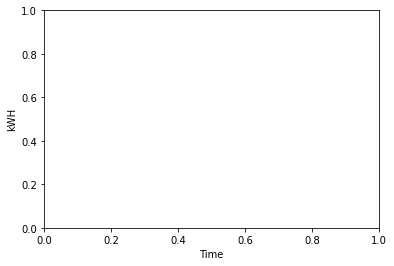

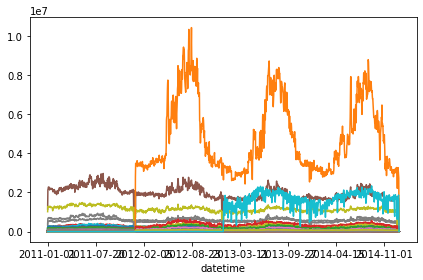

In [ ]:
file = '/content/drive/MyDrive/Colab Notebooks/datasets/time-series-version-ONLY-POSITIVE.csv'
open(file)
df = pd.read_csv(file, delimiter=',', header=0, index_col=[0], parse_dates=True)
print(df.describe)
print(df.shape)
print(df.dtypes)
print(df.info)
print(df.iloc[0:10, 0:5])



# not totally working! Ask Fernando.
- after getting general info about transformed dataset, it is important to get a sense of what it looks like. For a simpler first approach, it is possible to use matplotlib to plot lines for each data column.

In [ ]:
# # Plot line chart with datetime on x-axis and float values on y-axis
import matplotlib
def plot_line_chart(df):
  fig, ax = plt.subplots()
  df.plot(x=df.columns[0], y=df.columns[1:], kind='line')
  plt.legend().set_visible(False)
  ax.set_xlabel('Time')
  ax.set_ylabel("kWH")
  plt.tight_layout()
  plt.show()

plot_line_chart(df)

- next, a more refined form of visualization can be obtained by using plotly;

In [ ]:
import plotly.express as px
import pandas as pd

# Plot the line chart
fig = px.line(df, x=df.columns[0], y=df.columns[1:])

# Show the plot
fig.show()

/usr/local/lib/python3.8/dist-packages/plotly/express/_core.py:1222: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  df_output[col_name] = to_unindexed_series(df_input[argument])


- Even after aggregating data measured every 15min to daily total sum, energy consumption still constitute the units of measure for our float values;
- Since conventionally it is more common to express this kind of value in Kwh, and not, as we have done until this point, in "Kw15min", it is now important to change the unit of measure to Kwh;

In [ ]:
# change data measure unit from Kw15min to Kwh:

file = '/content/drive/MyDrive/Colab Notebooks/datasets/time-series-version-ONLY-POSITIVE.csv'

open(file)
df = pd.read_csv(file, delimiter=',', header=0, index_col=[0], parse_dates=True)

# Divide every float value in the dataframe by 4
def divide_by_four(value):
    try:
        return value / 4
    except TypeError:
        return value

df = df.applymap(divide_by_four)

# Save the resulting dataframe to a new CSV file
df.to_csv('/content/drive/MyDrive/Colab Notebooks/datasets/time-series-version-KWH.csv', index=False)

# For Fernando Chefinho:meu quirido: eu sei que vc falou que usar o dropna é ruim, mas eu ainda não sei o que eu faço "ao invés" disso. Eu posso refazer o código sem o dropna, mas também não sei se é isso que vc tem em mente. Se for, isso é fácil de rodar aqui.